In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

In [2]:
import numpy as np
import cv2
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as  plt
import tensorflow as tf
from tensorflow.keras import layers,models,optimizers
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout,Flatten
from sklearn.metrics import accuracy_score
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from tensorflow.keras.applications import VGG16,VGG19
import warnings
warnings.simplefilter('ignore')
from PIL import Image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

2024-06-20 02:32:47.841758: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-20 02:32:47.841866: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-20 02:32:47.978933: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Load the Dataset

In [3]:
df = pd.read_csv('/kaggle/input/cassava-leaf-disease-classification/train.csv')
df.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [4]:
df['label'].value_counts()

label
3    13158
4     2577
2     2386
1     2189
0     1087
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

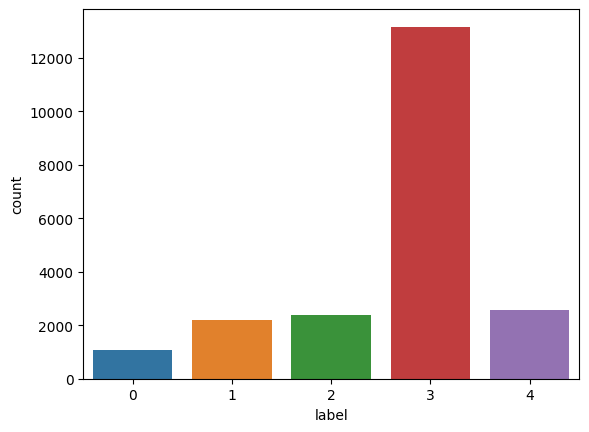

In [5]:
sns.countplot(df,x='label')

In [6]:
import json
with open('/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json') as file:
    print(json.dumps(json.loads(file.read()), indent=4))

{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}


# EDA

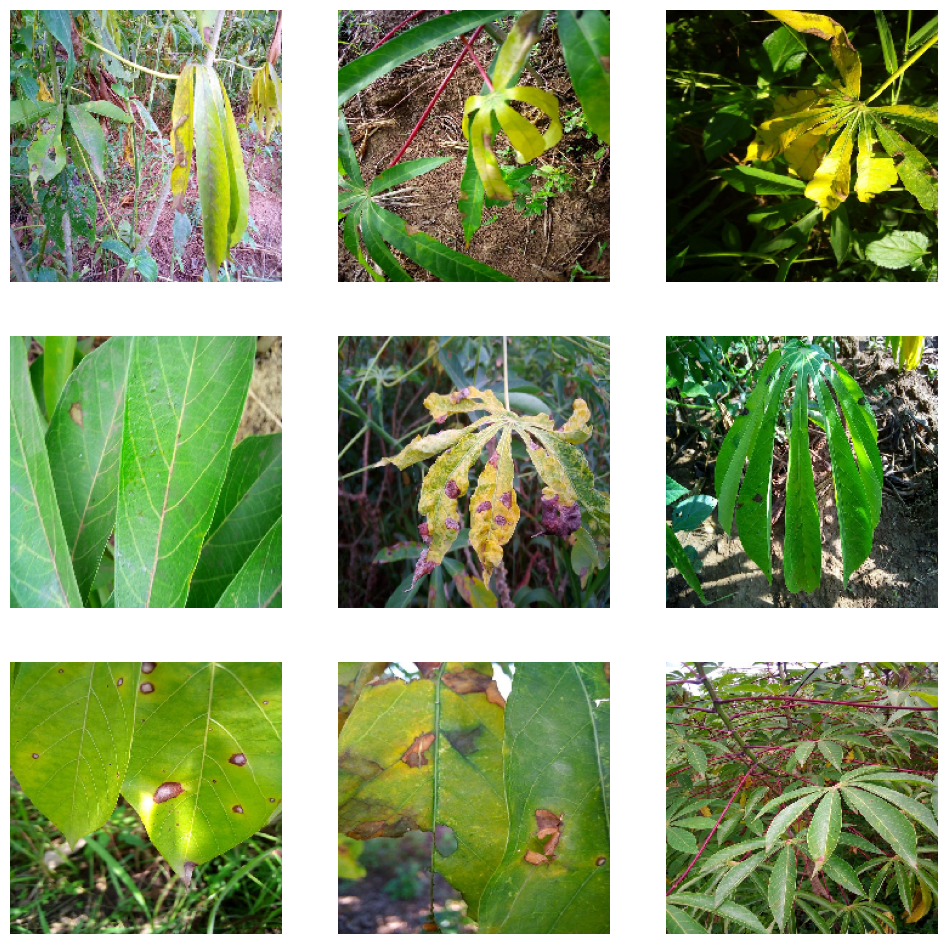

In [7]:
sample = df[df.label == 0].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join('/kaggle/input/cassava-leaf-disease-classification/train_images',image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

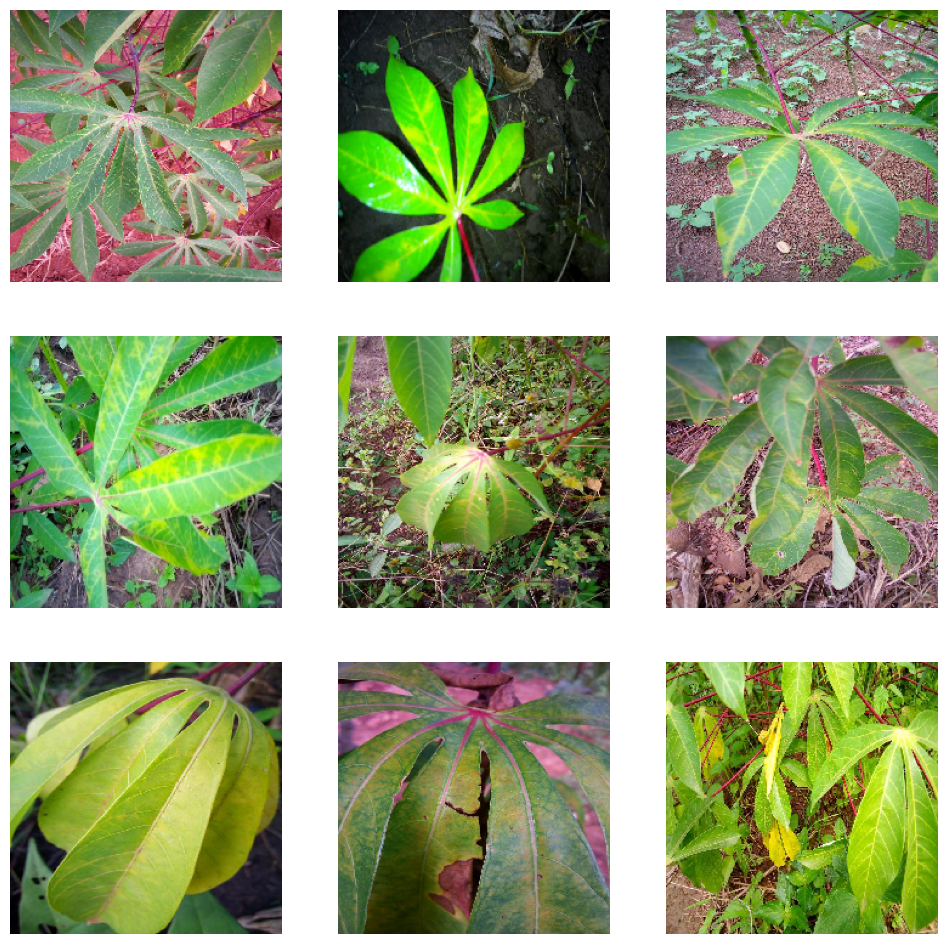

In [8]:
sample = df[df.label == 1].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join('/kaggle/input/cassava-leaf-disease-classification/train_images',image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

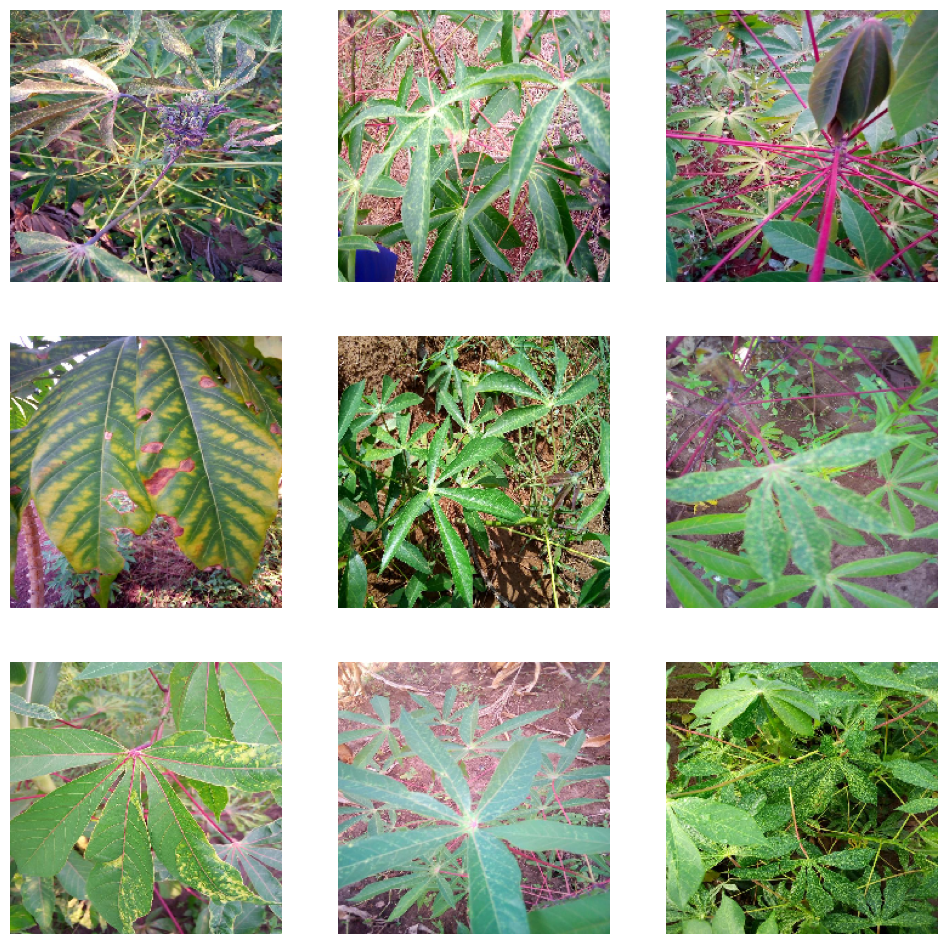

In [9]:
sample = df[df.label == 2].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join('/kaggle/input/cassava-leaf-disease-classification/train_images',image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

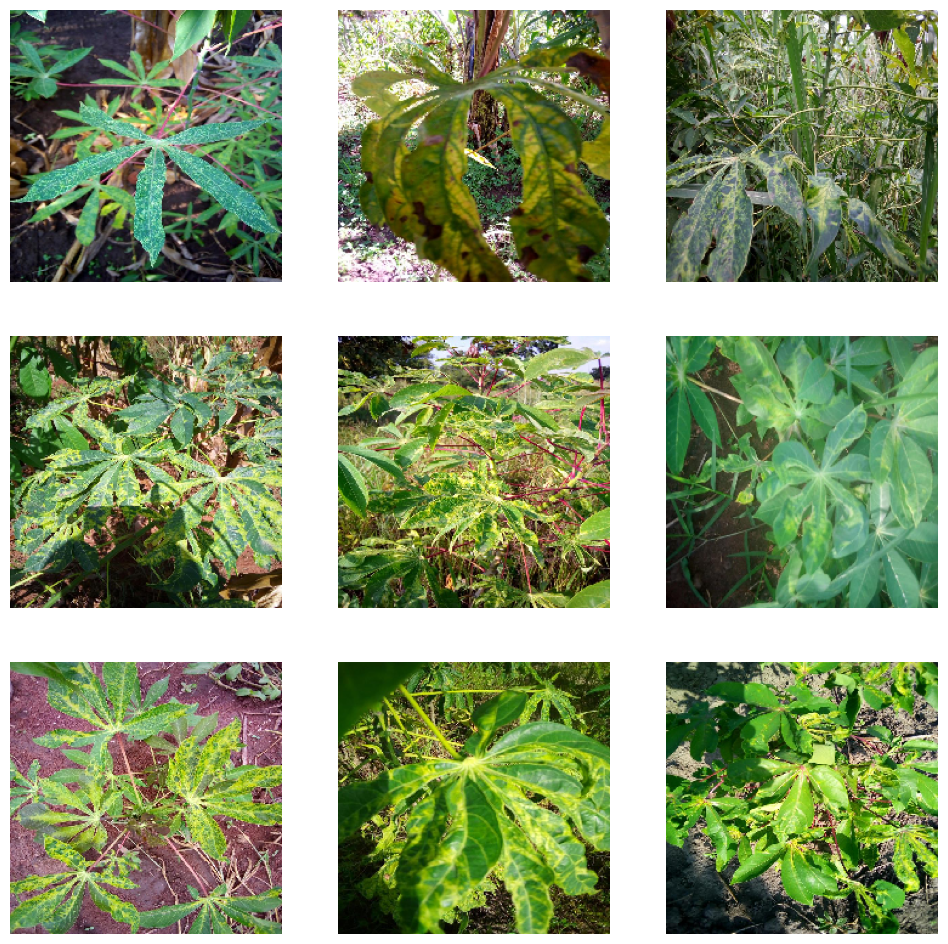

In [10]:
sample = df[df.label == 3].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join('/kaggle/input/cassava-leaf-disease-classification/train_images',image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

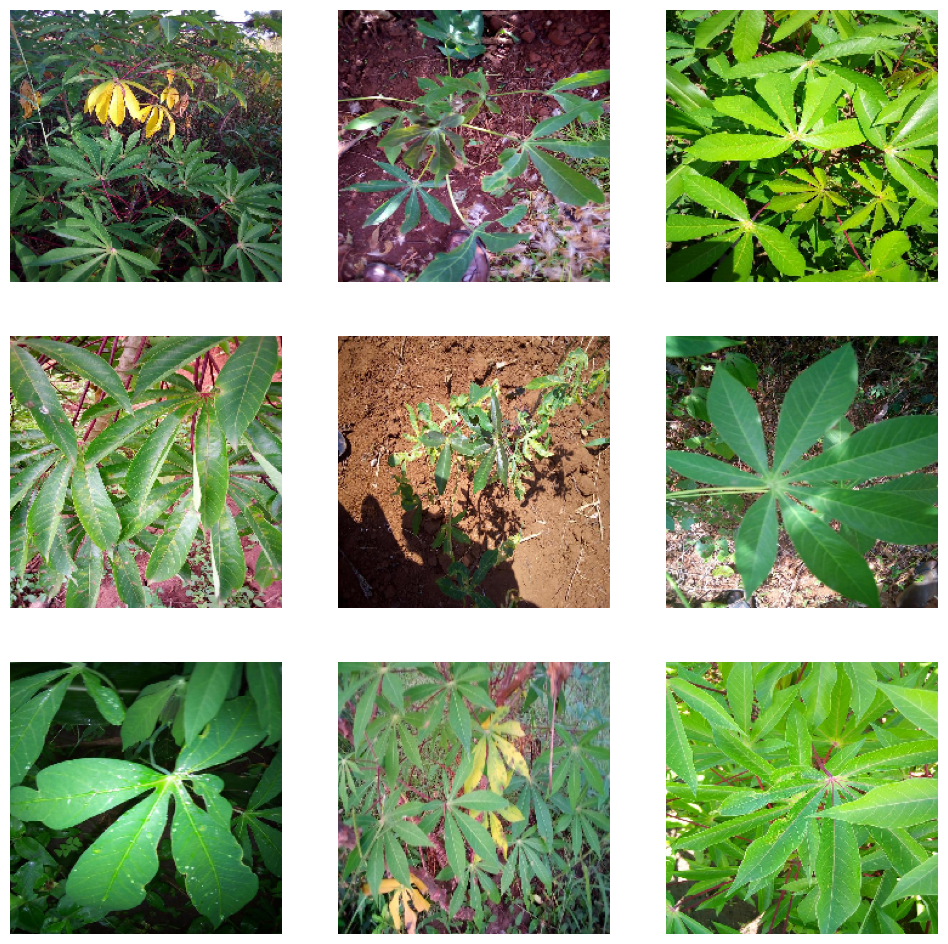

In [11]:
sample = df[df.label == 4].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join('/kaggle/input/cassava-leaf-disease-classification/train_images',image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

In [12]:
train_df = df.iloc[:20000,:]
test_df = df.iloc[20000:,:]

# Data Augumentation

In [13]:
train_df['label'] = train_df['label'].astype('str')
gen = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True,
    shear_range = 0.2,
    zoom_range = 0.2,
    rescale = 1/255.,
)
train_datagen = gen.flow_from_dataframe(
    train_df,
    directory = "/kaggle/input/cassava-leaf-disease-classification/train_images",
    batch_size = 32,
    target_size = (224,224),
    seed = 42,
    x_col = 'image_id',
    y_col = 'label',
    class_mode = 'categorical'
)

Found 20000 validated image filenames belonging to 5 classes.


In [14]:
test_df['label'] = test_df['label'].astype('str')
gen = ImageDataGenerator(
    rescale = 1/255.,
)
test_datagen = gen.flow_from_dataframe(
    test_df,
    directory='/kaggle/input/cassava-leaf-disease-classification/train_images',
    batch_size = 32,
    target_size = (224,224),
    seed = 42,
    x_col = 'image_id',
    y_col = 'label',
    class_mode = 'categorical'
)

Found 1397 validated image filenames belonging to 5 classes.


# Modelling

In [15]:
model = models.Sequential()
model.add(VGG16(include_top = False,weights = 'imagenet',input_shape=(224,224,3)))
model.add(GlobalAveragePooling2D())

model.add(Flatten())

model.add(Dense(256,activation='elu'))
model.add(Dropout(0.3))

model.add(Dense(5,activation='softmax'))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [16]:
loss = tf.keras.losses.CategoricalCrossentropy(
    label_smoothing = 0.001,
    name = 'categorical_crossentropy'
)

In [17]:
optimizer = Adam(learning_rate = 1e-4)

In [18]:
model.compile(optimizer = optimizer,loss=loss,metrics= ['categorical_accuracy'])

In [19]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ ?                      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

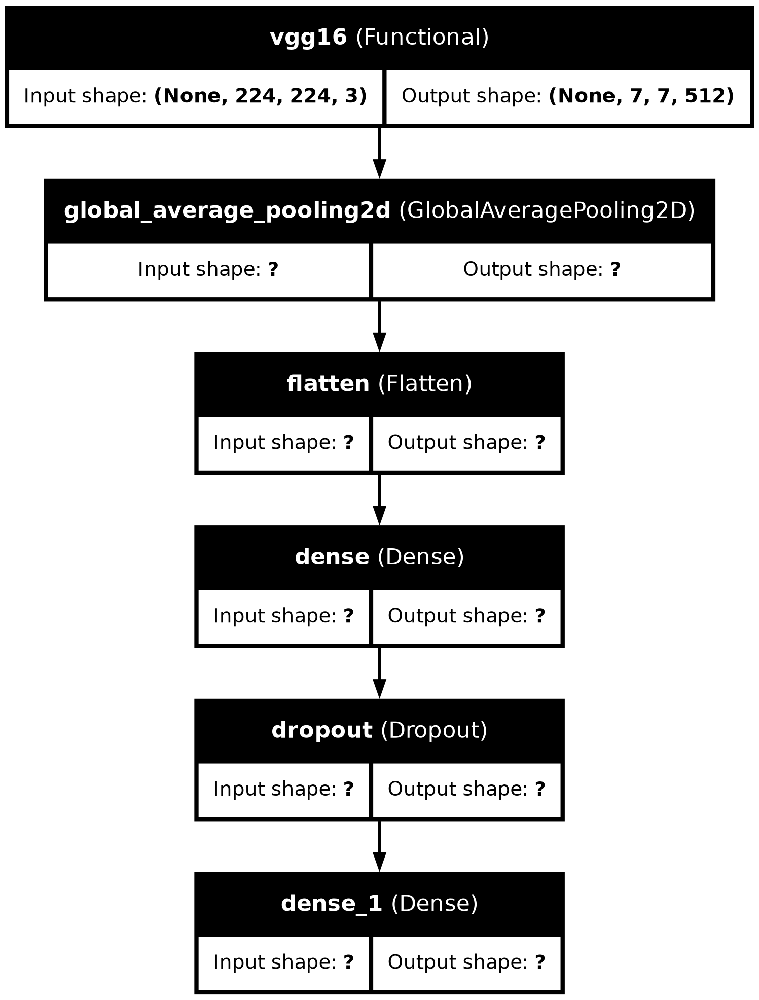

In [20]:
model.build((None))
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

# Train the model

In [21]:
rlrong = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    mode='min',
    min_lr = 1e-5,
    patience = 2,
    verbose=1
)
estop = EarlyStopping(
    monitor = 'val_loss',
    mode= 'min',
    patience = 3,
    verbose = 1,
    restore_best_weights = True
)

In [22]:
history = model.fit(train_datagen,epochs = 5,verbose=1,validation_data = test_datagen,callbacks = [rlrong,estop])

Epoch 1/5


2024-06-20 02:33:31.569846: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.63498, expected 3.85968
2024-06-20 02:33:31.569904: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.55784, expected 5.78254
2024-06-20 02:33:31.569914: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 6.61282, expected 5.83752
2024-06-20 02:33:31.569922: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 6.34499, expected 5.56968
2024-06-20 02:33:31.569930: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 6.25159, expected 5.47629
2024-06-20 02:33:31.569937: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 5.43964, expected 4.66434
2024-06-20 02:33:31.569945: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 9: 6.54333, expected 5.76803
2024-06-20 02:33:31.569953: E external/local_xla/xla/se

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - categorical_accuracy: 0.6173 - loss: 1.1069

2024-06-20 02:40:16.750211: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.78283, expected 2.94933
2024-06-20 02:40:16.750275: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 5.74976, expected 4.91626
2024-06-20 02:40:16.750285: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 5.76648, expected 4.93298
2024-06-20 02:40:16.750293: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 5.49029, expected 4.65679
2024-06-20 02:40:16.750301: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 4.99986, expected 4.16636
2024-06-20 02:40:16.750309: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.68302, expected 4.84952
2024-06-20 02:40:16.750317: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 6.36663, expected 5.53313
2024-06-20 02:40:16.750324: E external/local_xla/xla/se

625/625 ━━━━━━━━━━━━━━━━━━━━ 426s 608ms/step - categorical_accuracy: 0.6174 - loss: 1.1067 - val_categorical_accuracy: 0.7044 - val_loss: 10.3064 - learning_rate: 1.0000e-04
Epoch 2/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 274s 433ms/step - categorical_accuracy: 0.6965 - loss: 0.8154 - val_categorical_accuracy: 0.7344 - val_loss: 11.5726 - learning_rate: 1.0000e-04
Epoch 3/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 274s 433ms/step - categorical_accuracy: 0.7472 - loss: 0.6885 - val_categorical_accuracy: 0.6779 - val_loss: 7.8966 - learning_rate: 1.0000e-04
Epoch 4/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 321s 431ms/step - categorical_accuracy: 0.7664 - loss: 0.6416 - val_categorical_accuracy: 0.7910 - val_loss: 20.9996 - learning_rate: 1.0000e-04
Epoch 5/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - categorical_accuracy: 0.7929 - loss: 0.5889
Epoch 5: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
625/625 ━━━━━━━━━━━━━━━━━━━━ 294s 465ms/step - categorical_accuracy: 0.7929 - loss: 0.5889 - val_ca